In [ ]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.callbacks import TensorBoard
import random
import tensorflow as tf

import datetime
from google.colab import drive
from zipfile import ZipFile
import gc
import os

In [ ]:
file_name = "/content/drive/MyDrive/Deep Learning/data.zip"
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
train_dir = '/content/data/train'
test_dir = '/content/data/validation'
train_dogs = ['/content/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'dog' in i] #get dog images
train_cats = ['/content/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'cat' in i] #get cat images
test_imgs = ['/content/data/validation/{}'.format(i) for i in os.listdir(test_dir)] #get test images
train_imgs = train_dogs[:2000] + train_cats[:2000] # slice the dataset and use 2000 in each class
random.shuffle(train_imgs) # shuffle it randomly

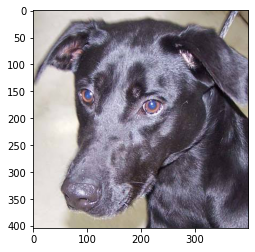

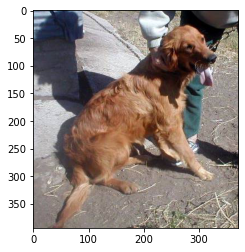

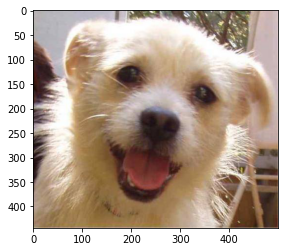

In [ ]:
import matplotlib.image as mpimg
for ima in train_imgs[0:3]:
  img=mpimg.imread(ima)
  imgplot = plt.imshow(img)
  plt.show()

In [ ]:
# Lets declare our image dimensions
# we are using coloured images.
nrows = 150
ncolumns = 150

channels = 3 # change to 1 if you want to use grayscale image
# A function to read and process the images to an acceptable format for our model
def read_and_process_image(list_of_images):
  """
  Returns two arrays:
  X is an array of resized images
  y is an array of labels
  """
  X = [] # images
  y = [] # labels
  for image in list_of_images:
    im = cv2.imread(image, cv2.IMREAD_COLOR)
    im2 = cv2.resize(im,(nrows, ncolumns),
    interpolation=cv2.INTER_CUBIC)
    X.append(im2)
  # X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR),(nrows, ncolumns), interpolation=cv2.INTER_CUBIC)) # Read the image
  # get the labels
    if 'dog' in image:
      y.append(1)
    elif 'cat' in image:
      y.append(0)
  return X, y

In [ ]:
#get the train and label data
X, y = read_and_process_image(train_imgs)

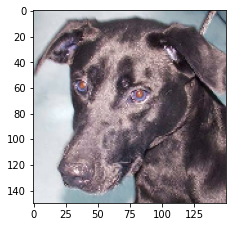

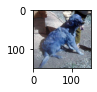

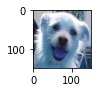

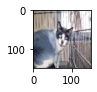

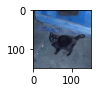

In [ ]:
#Lets view some of the pics
plt.figure(figsize=(20,10))
columns = 5
for i in range(columns):
  plt.subplot(5 / columns + 1, columns, i + 1)
  imgplot = plt.imshow(X[i])
  plt.show()

In [ ]:
X = np.array(X)
y = np.array(y)

print("Shape of train images is:", X.shape)
print("Shape of labels is:", y.shape)

Shape of train images is: (2048, 150, 150, 3)
Shape of labels is: (2048,)


In [ ]:
#Lets split the data into train and test set
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20,random_state=2)
print("Shape of train images is:", X_train.shape)
print("Shape of validation images is:", X_val.shape)
print("Shape of labels is:", y_train.shape)
print("Shape of labels is:", y_val.shape)
#clear memory
del X
del y
gc.collect()
#get the length of the train and validation data
ntrain = len(X_train)
nval = len(X_val)
#We will use a batch size of 32. Note: batch size should be a factor of 2.***4,8,16,32,64...***
batch_size = 32

Shape of train images is: (1638, 150, 150, 3)
Shape of validation images is: (410, 150, 150, 3)
Shape of labels is: (1638,)
Shape of labels is: (410,)


In [ ]:

from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, load_img

"""To create our model, we are going to use an architecture insired from
vggnet https://arxiv.org/pdf/1409.1556.pdf, in which you can see below
that our filter size increases as we go down layers
32 → 64 →128 →512—and final layer is 1"""
model = models.Sequential() # (1)
model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(150,
150, 3)))#(2)
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2))) # (3)
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten()) # (4)
model.add(layers.Dropout(0.5)) #Dropout for regularization # (5)
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid')) # (6) #Sigmoid function at the end because we have just two classes

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [ ]:
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255, #Scale the image between 0 and 1
  rotation_range=40,
  width_shift_range=0.2,
  height_shift_range=0.2,
  shear_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True,)
val_datagen = ImageDataGenerator(rescale=1./255) #We do not augment validation data. we only perform rescale

In [ ]:
#Create the image generators
train_generator = train_datagen.flow(X_train, y_train,batch_size=batch_size)
val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
history = model.fit_generator(train_generator,steps_per_epoch=ntrain // batch_size,epochs=32,validation_data=val_generator,validation_steps=nval // batch_size)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  after removing the cwd from sys.path.


Epoch 1/32
51/51 [==============================] - 17s 160ms/step - loss: 0.6947 - acc: 0.5075 - val_loss: 0.6902 - val_acc: 0.5729
Epoch 2/32
51/51 [==============================] - 8s 157ms/step - loss: 0.6903 - acc: 0.5268 - val_loss: 0.7068 - val_acc: 0.4401
Epoch 3/32
51/51 [==============================] - 9s 178ms/step - loss: 0.6838 - acc: 0.5579 - val_loss: 0.6818 - val_acc: 0.5260
Epoch 4/32
51/51 [==============================] - 8s 155ms/step - loss: 0.6723 - acc: 0.5841 - val_loss: 0.7098 - val_acc: 0.4818
Epoch 5/32
51/51 [==============================] - 8s 165ms/step - loss: 0.6696 - acc: 0.5903 - val_loss: 0.6998 - val_acc: 0.5052
Epoch 6/32
51/51 [==============================] - 8s 156ms/step - loss: 0.6586 - acc: 0.6034 - val_loss: 0.6356 - val_acc: 0.6224
Epoch 7/32
51/51 [==============================] - 8s 155ms/step - loss: 0.6552 - acc: 0.6146 - val_loss: 0.6546 - val_acc: 0.5990
Epoch 8/32
51/51 [==============================] - 8s 155ms/step - loss: 0

In [ ]:
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

In [ ]:
model.save_weights('model_wieghts.h5')
model.save('model_keras.h5')

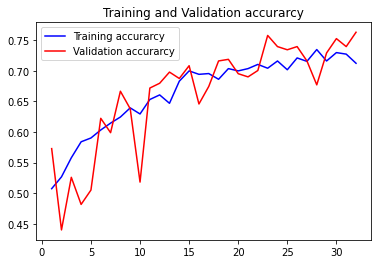

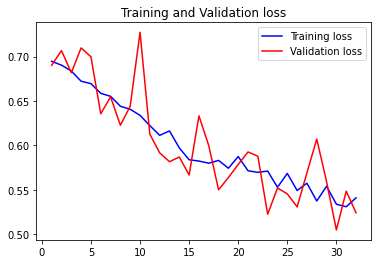

In [ ]:
#lets plot the train and val curve
#get the details form the history object
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()
plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [ ]:
X_test, y_test = read_and_process_image(test_imgs[0:10]) #Y_test in this case will be empty.
x = np.array(X_test)
test_datagen = ImageDataGenerator(rescale=1./255)

1/1 [==============================] - 0s 15ms/step


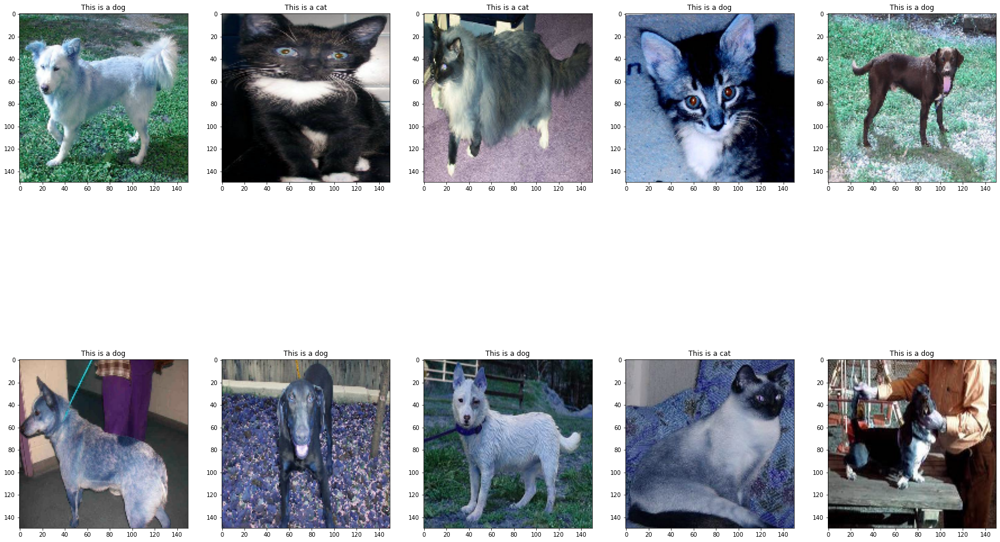

In [ ]:
i = 0
text_labels = []
plt.figure(figsize=(30,20))
for batch in test_datagen.flow(x, batch_size=1):
  pred = model.predict(batch)
  if pred > 0.5:
    text_labels.append('dog')
  else:
    text_labels.append('cat')
  plt.subplot(5 / columns + 1, columns, i + 1)
  plt.title('This is a ' + text_labels[i])
  imgplot = plt.imshow(batch[0])
  i += 1
  if i % 10 == 0:
    break
plt.show()